### Get lagged data

According to the *Interim Estimates of Vaccine Effectiveness of BNT162b2 and mRNA-1273 COVID-19 Vaccines in Preventing SARS-CoV-2 Infection Among Health Care Personnel, First Responders, and Other Essential and Frontline Workers — Eight U.S. Locations, December 2020–March 2021* published by CDC, the effectiveness of vaccines has around 14 days lag. Thus, we will add two column **vaccine lag-7** and **vaccine lag-14** for our analysis.

In [1]:
import pandas as pd
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
import statsmodels.api as sm
from sklearn import svm
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import RandomizedSearchCV
from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
import shap
import numpy as np
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn import tree
from sklearn.model_selection import GridSearchCV
import seaborn as sn

In [111]:
data = pd.read_csv("data.csv")

In [112]:
data.columns

Index(['Unnamed: 0', 'state', 'date',
       'retail_and_recreation_percent_change_from_baseline',
       'grocery_and_pharmacy_percent_change_from_baseline',
       'parks_percent_change_from_baseline',
       'transit_stations_percent_change_from_baseline',
       'workplaces_percent_change_from_baseline',
       'residential_percent_change_from_baseline', 'stay_at_home',
       'mask_mandate', 'business_open', 'people_fully_vaccinated_per_hundred',
       'daily_vaccinations_per_million', 'submission_date', 'state_abbr',
       'new_case', 'new_case_ma7', 'new_death', 'new_death_ma7',
       'population_density', 'population', 'new_death_growth_rate',
       'new_case_growth_rate', 'new_death_growth_rate_weekly',
       'new_case_growth_rate_weekly', 'new_death_pct', 'new_case_pct'],
      dtype='object')

In [113]:
data = data.replace("no value", None)

In [114]:
data["retail_and_recreation_percent_change_from_baseline"] = data["retail_and_recreation_percent_change_from_baseline"] / 100
data["grocery_and_pharmacy_percent_change_from_baseline"] = data["grocery_and_pharmacy_percent_change_from_baseline"] / 100
data["parks_percent_change_from_baseline"] = data["parks_percent_change_from_baseline"].astype(float) / 100
data["transit_stations_percent_change_from_baseline"] = data["transit_stations_percent_change_from_baseline"] / 100
data["workplaces_percent_change_from_baseline"] = data["workplaces_percent_change_from_baseline"] / 100
data["residential_percent_change_from_baseline"] = data["residential_percent_change_from_baseline"] / 100

In [115]:
new_data = pd.DataFrame()
for state in data["state"].unique():
    s = data[data["state"] == state]
    s["people_fully_vaccinated_per_hundred_lag7"] = s["people_fully_vaccinated_per_hundred"].shift(7)
    s["people_fully_vaccinated_per_hundred_lag14"] = s["people_fully_vaccinated_per_hundred"].shift(14)
    s["daily_vaccinations_per_million_lag7"] = s["daily_vaccinations_per_million"].shift(7)
    s["daily_vaccinations_per_million_lag14"] = s["daily_vaccinations_per_million"].shift(14)
    s["retail_and_recreation_percent_change_lag7"] = s["retail_and_recreation_percent_change_from_baseline"].shift(7)
    s["grocery_and_pharmacy_percent_change_lag7"] = s["grocery_and_pharmacy_percent_change_from_baseline"].shift(7)
    s["parks_percent_change_lag7"] = s["parks_percent_change_from_baseline"].shift(7)
    s["transit_stations_percent_change_lag7"] = s["transit_stations_percent_change_from_baseline"].shift(7)
    s["workplaces_percent_change_lag7"] = s["workplaces_percent_change_from_baseline"].shift(7)
    s["residential_percent_change_lag7"] = s["residential_percent_change_from_baseline"].shift(7)
    s["retail_and_recreation_percent_change_lag14"] = s["retail_and_recreation_percent_change_from_baseline"].shift(14)
    s["grocery_and_pharmacy_percent_change_lag14"] = s["grocery_and_pharmacy_percent_change_from_baseline"].shift(14)
    s["parks_percent_change_lag14"] = s["parks_percent_change_from_baseline"].shift(14)
    s["transit_stations_percent_change_lag14"] = s["transit_stations_percent_change_from_baseline"].shift(14)
    s["workplaces_percent_change_lag14"] = s["workplaces_percent_change_from_baseline"].shift(14)
    s["residential_percent_change_lag14"] = s["residential_percent_change_from_baseline"].shift(14)
    new_data = new_data.append(s)


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

In [116]:
new_data = new_data[pd.to_datetime(new_data["date"]) > pd.to_datetime("2021-01-07")]

In [117]:
new_data.describe()

,Unnamed: 0,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline,stay_at_home,mask_mandate,business_open,...,parks_percent_change_lag7,transit_stations_percent_change_lag7,workplaces_percent_change_lag7,residential_percent_change_lag7,retail_and_recreation_percent_change_lag14,grocery_and_pharmacy_percent_change_lag14,parks_percent_change_lag14,transit_stations_percent_change_lag14,workplaces_percent_change_lag14,residential_percent_change_lag14
count,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,...,5253.000000,5253.000000,5253.000000,5253.000000,4896.000000,4896.000000,4896.000000,4896.000000,4896.000000,4896.000000
mean,2808.000000,-0.152975,-0.067245,0.060257,-0.241310,-0.250788,0.082385,0.019608,0.688940,0.345136,...,0.024649,-0.254146,-0.258011,0.087175,-0.174295,-0.080758,-0.003150,-0.263246,-0.259990,0.089563
std,1619.583283,0.134506,0.095527,0.387121,0.199108,0.115044,0.046929,0.138662,0.462972,0.494692,...,0.362647,0.197182,0.123942,0.049649,0.133477,0.097713,0.344182,0.193751,0.125341,0.049718
min,7.000000,-0.790000,-0.660000,-0.760000,-0.840000,-0.860000,-0.040000,0.000000,0.000000,0.000000,...,-0.760000,-0.870000,-0.860000,-0.040000,-0.790000,-0.660000,-0.760000,-0.870000,-0.860000,-0.040000
25%,1404.000000,-0.230000,-0.120000,-0.210000,-0.390000,-0.320000,0.050000,0.000000,0.000000,0.000000,...,-0.220000,-0.400000,-0.330000,0.050000,-0.250000,-0.130000,-0.230000,-0.400000,-0.330000,0.060000
50%,2808.000000,-0.150000,-0.070000,-0.030000,-0.240000,-0.250000,0.080000,0.000000,1.000000,0.000000,...,-0.050000,-0.250000,-0.250000,0.080000,-0.170000,-0.080000,-0.070000,-0.270000,-0.250000,0.080000
75%,4212.000000,-0.060000,-0.010000,0.250000,-0.110000,-0.160000,0.110000,0.000000,1.000000,1.000000,...,0.190000,-0.120000,-0.170000,0.110000,-0.090000,-0.020000,0.140000,-0.130000,-0.170000,0.120000
max,5609.000000,0.200000,0.330000,2.570000,0.440000,0.000000,0.360000,1.000000,1.000000,2.000000,...,2.570000,0.440000,0.000000,0.360000,0.200000,0.330000,2.170000,0.340000,0.000000,0.360000


In [118]:
import matplotlib.pyplot as plt

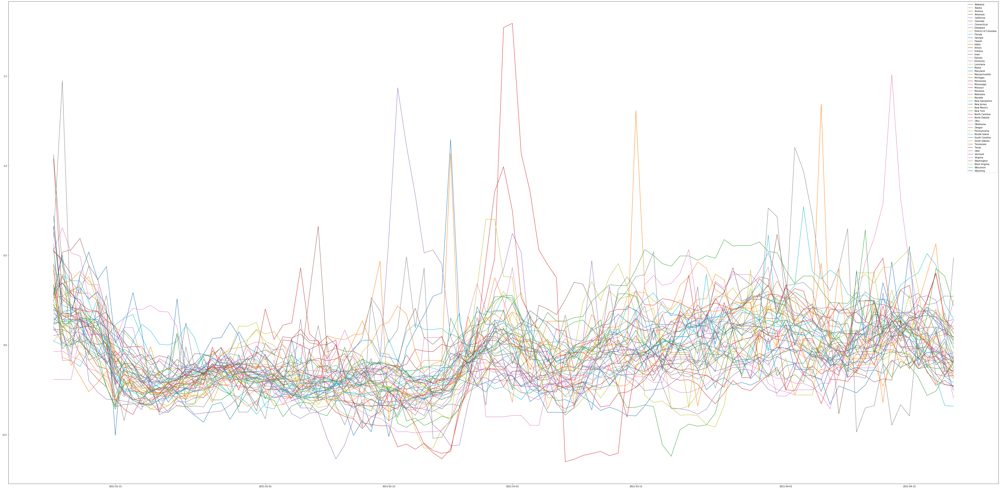

In [119]:
fig= plt.figure(figsize=(80,40))

for state in new_data["state"].unique():
    sub = new_data[new_data["state"] == state]

    x = pd.to_datetime(sub["date"])
    y = sub["new_case_growth_rate_weekly"]

    plt.plot(x, y, label = state)

plt.legend()

plt.show()

In [120]:
len(new_data)

5253

In [121]:
data_without_na = new_data.dropna()

In [122]:
data_without_na.columns

Index(['Unnamed: 0', 'state', 'date',
       'retail_and_recreation_percent_change_from_baseline',
       'grocery_and_pharmacy_percent_change_from_baseline',
       'parks_percent_change_from_baseline',
       'transit_stations_percent_change_from_baseline',
       'workplaces_percent_change_from_baseline',
       'residential_percent_change_from_baseline', 'stay_at_home',
       'mask_mandate', 'business_open', 'people_fully_vaccinated_per_hundred',
       'daily_vaccinations_per_million', 'submission_date', 'state_abbr',
       'new_case', 'new_case_ma7', 'new_death', 'new_death_ma7',
       'population_density', 'population', 'new_death_growth_rate',
       'new_case_growth_rate', 'new_death_growth_rate_weekly',
       'new_case_growth_rate_weekly', 'new_death_pct', 'new_case_pct',
       'people_fully_vaccinated_per_hundred_lag7',
       'people_fully_vaccinated_per_hundred_lag14',
       'daily_vaccinations_per_million_lag7',
       'daily_vaccinations_per_million_lag14',
       

### Policy and mobility

In [31]:
mob = ['retail_and_recreation_percent_change_from_baseline',
       'grocery_and_pharmacy_percent_change_from_baseline',
       'parks_percent_change_from_baseline',
       'transit_stations_percent_change_from_baseline',
       'workplaces_percent_change_from_baseline',
       'residential_percent_change_from_baseline']
pol = ['stay_at_home',
       'mask_mandate', 'business_open']

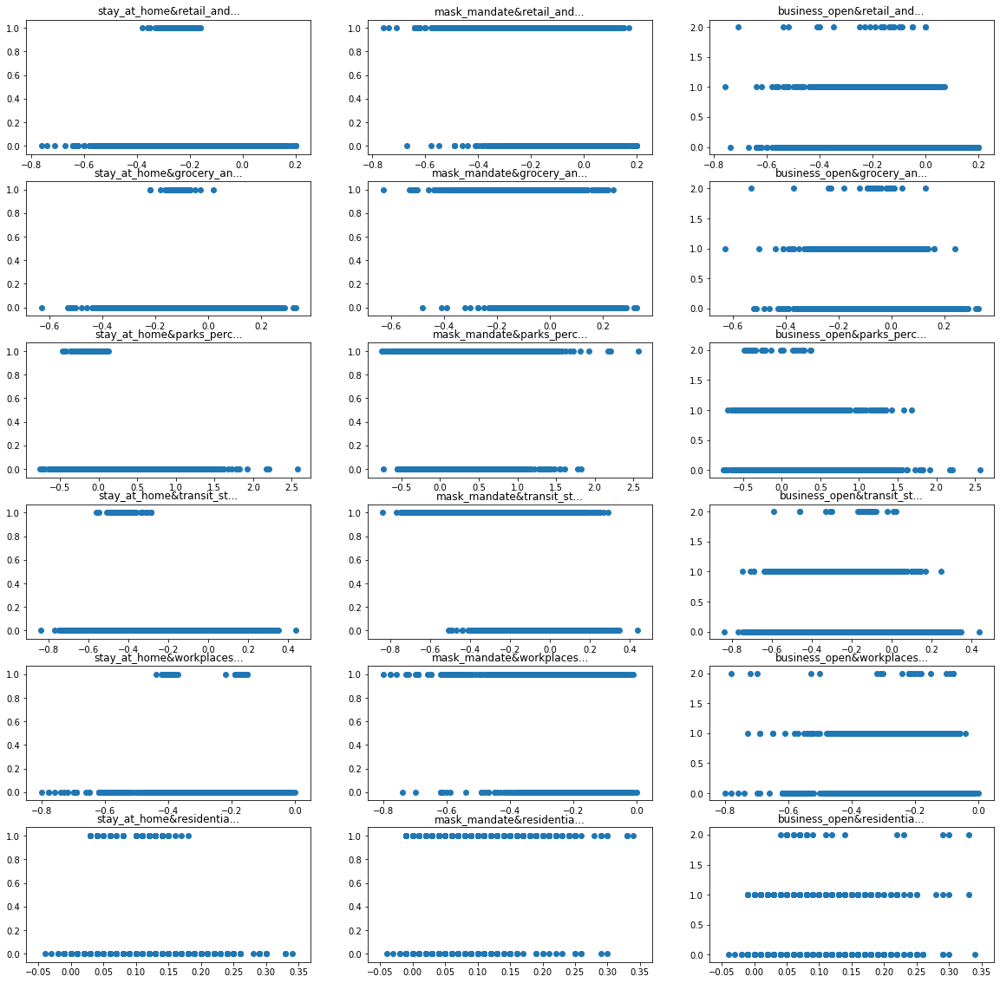

In [21]:
fig = plt.figure(figsize=(20, 20))
axs = fig.subplots(len(mob), len(pol))
for i in range(0, len(pol)):
    for j in range(0, len(mob)):
        axs[j, i].scatter(data_without_na[mob[j]], data_without_na[pol[i]])
        axs[j, i].set_title(pol[i]+"&"+mob[j][:10]+"...")

plt.show()

### Correlation matrix

In [22]:
columns = ['retail_and_recreation_percent_change_from_baseline',
       'grocery_and_pharmacy_percent_change_from_baseline',
       'parks_percent_change_from_baseline',
       'transit_stations_percent_change_from_baseline',
       'workplaces_percent_change_from_baseline',
       'residential_percent_change_from_baseline']

In [23]:
X = data_without_na[columns]

In [24]:
X.corr()

,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
retail_and_recreation_percent_change_from_baseline,1.000000,0.868974,0.617132,0.808386,0.524715,-0.723859
grocery_and_pharmacy_percent_change_from_baseline,0.868974,1.000000,0.596800,0.713260,0.500764,-0.681891
parks_percent_change_from_baseline,0.617132,0.596800,1.000000,0.486756,0.325315,-0.574889
transit_stations_percent_change_from_baseline,0.808386,0.713260,0.486756,1.000000,0.603781,-0.746291
workplaces_percent_change_from_baseline,0.524715,0.500764,0.325315,0.603781,1.000000,-0.858674
residential_percent_change_from_baseline,-0.723859,-0.681891,-0.574889,-0.746291,-0.858674,1.000000


In [25]:
corr = X.corr()

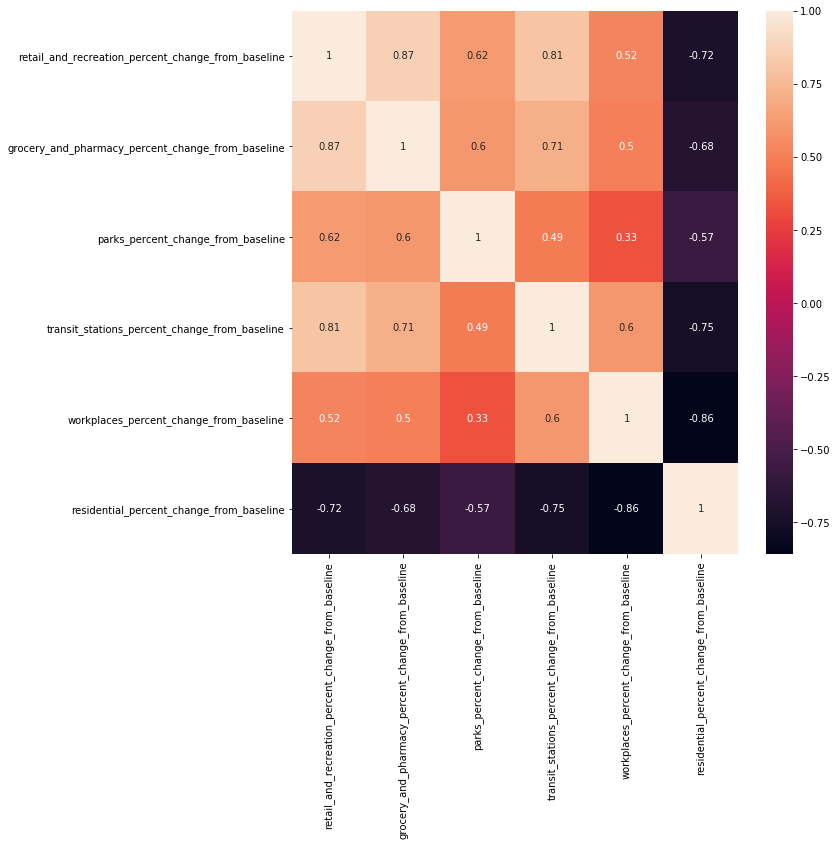

In [26]:
fig= plt.figure(figsize=(10,10))

sn.heatmap(corr, annot=True)
plt.show()

In [27]:
for i in range(corr.shape[0]):
    for j in range(i+1, corr.shape[0]):
        if abs(corr.iloc[i,j]) >= 0.85:
            print(i, j, columns[i], columns[j], corr.iloc[i,j])

0 1 retail_and_recreation_percent_change_from_baseline grocery_and_pharmacy_percent_change_from_baseline 0.8689741130830179
4 5 workplaces_percent_change_from_baseline residential_percent_change_from_baseline -0.8586742050134736


### Mobility feature selection

In [123]:
Y2 = data_without_na["new_case_growth_rate_weekly"]

In [124]:
columns = [
       'retail_and_recreation_percent_change_lag7',
       'grocery_and_pharmacy_percent_change_lag7', 'parks_percent_change_lag7',
       'transit_stations_percent_change_lag7',
       'workplaces_percent_change_lag7', 'residential_percent_change_lag7',
       'retail_and_recreation_percent_change_lag14',
       'grocery_and_pharmacy_percent_change_lag14',
       'parks_percent_change_lag14', 'transit_stations_percent_change_lag14',
       'workplaces_percent_change_lag14', 'residential_percent_change_lag14'
       ]
features = len(columns)
c = columns.copy()

In [125]:
X = data_without_na[c]
scaler = RobustScaler() 
X_scaled = scaler.fit_transform(X)

In [126]:
regressor_OLS = sm.OLS(Y2, X_scaled).fit()
for i in range(len(columns)):
    print(columns[i], regressor_OLS.pvalues[i])

retail_and_recreation_percent_change_lag7 9.360736954388214e-11
grocery_and_pharmacy_percent_change_lag7 6.726182135441072e-10
parks_percent_change_lag7 4.361761243158177e-05
transit_stations_percent_change_lag7 1.2211608362763881e-05
workplaces_percent_change_lag7 0.06487954447172366
residential_percent_change_lag7 1.6292519852813074e-12
retail_and_recreation_percent_change_lag14 0.1386533518981868
grocery_and_pharmacy_percent_change_lag14 3.922145286020213e-07
parks_percent_change_lag14 0.3015071510152815
transit_stations_percent_change_lag14 0.6494250461374306
workplaces_percent_change_lag14 0.006645882586058008
residential_percent_change_lag14 0.31455346304593285


In [127]:
for i in range(0, features):
    X = data_without_na[c]
    scaler = RobustScaler() 
    X_scaled = scaler.fit_transform(X)
    regressor_OLS = sm.OLS(Y2, X_scaled).fit()
    maxVar = max(regressor_OLS.pvalues)
    if maxVar > 0.05:
        for j in range(0, features - i):
            if (regressor_OLS.pvalues[j].astype(float) == maxVar):
                print(maxVar, c[j])
                c = np.delete(c, j)
    if maxVar <= 0.05:
        break
                
print(regressor_OLS.summary())
for i in range(len(c)):
    print(c[i], regressor_OLS.pvalues[i])


0.6494250461374306 transit_stations_percent_change_lag14
0.26722037860619596 parks_percent_change_lag14
0.19970722088312565 retail_and_recreation_percent_change_lag14
                                     OLS Regression Results                                     
Dep. Variable:     new_case_growth_rate_weekly   R-squared (uncentered):                   0.145
Model:                                     OLS   Adj. R-squared (uncentered):              0.143
Method:                          Least Squares   F-statistic:                              72.05
Date:                         Tue, 27 Apr 2021   Prob (F-statistic):                   2.52e-123
Time:                                 01:31:35   Log-Likelihood:                          760.48
No. Observations:                         3845   AIC:                                     -1503.
Df Residuals:                             3836   BIC:                                     -1447.
Df Model:                                    9           

In [134]:
selected_mob_column = ['retail_and_recreation_percent_change_lag7',
       'parks_percent_change_lag7',
       'transit_stations_percent_change_lag7',
       'residential_percent_change_lag7']

In [129]:
new_data = pd.concat([new_data, pd.get_dummies(new_data["business_open"], prefix="business_open")], axis=1)
new_data.columns

Index(['Unnamed: 0', 'state', 'date',
       'retail_and_recreation_percent_change_from_baseline',
       'grocery_and_pharmacy_percent_change_from_baseline',
       'parks_percent_change_from_baseline',
       'transit_stations_percent_change_from_baseline',
       'workplaces_percent_change_from_baseline',
       'residential_percent_change_from_baseline', 'stay_at_home',
       'mask_mandate', 'business_open', 'people_fully_vaccinated_per_hundred',
       'daily_vaccinations_per_million', 'submission_date', 'state_abbr',
       'new_case', 'new_case_ma7', 'new_death', 'new_death_ma7',
       'population_density', 'population', 'new_death_growth_rate',
       'new_case_growth_rate', 'new_death_growth_rate_weekly',
       'new_case_growth_rate_weekly', 'new_death_pct', 'new_case_pct',
       'people_fully_vaccinated_per_hundred_lag7',
       'people_fully_vaccinated_per_hundred_lag14',
       'daily_vaccinations_per_million_lag7',
       'daily_vaccinations_per_million_lag14',
       

### Vaccine feature selection

In [21]:
columns = ['people_fully_vaccinated_per_hundred',
       'daily_vaccinations_per_million',
        'people_fully_vaccinated_per_hundred_lag7',
       'people_fully_vaccinated_per_hundred_lag14',
       'daily_vaccinations_per_million_lag7',
       'daily_vaccinations_per_million_lag14']
features = len(columns)
c = columns.copy()

In [22]:
X = data_without_na[c]
scaler = RobustScaler() 
X_scaled = scaler.fit_transform(X)

In [23]:
regressor_OLS = sm.OLS(Y2, X_scaled).fit()
for i in range(len(columns)):
    print(columns[i], regressor_OLS.pvalues[i])

people_fully_vaccinated_per_hundred 0.7933380323349417
daily_vaccinations_per_million 0.03964668438979904
people_fully_vaccinated_per_hundred_lag7 0.9897685350884524
people_fully_vaccinated_per_hundred_lag14 0.5037994666062169
daily_vaccinations_per_million_lag7 0.05706209991383234
daily_vaccinations_per_million_lag14 0.0002003726439380224


In [24]:
for i in range(0, features):
    X = data_without_na[c]
    scaler = RobustScaler() 
    X_scaled = scaler.fit_transform(X)
    regressor_OLS = sm.OLS(Y2, X_scaled).fit()
    maxVar = max(regressor_OLS.pvalues)
    if maxVar > 0.05:
        for j in range(0, features - i):
            if (regressor_OLS.pvalues[j].astype(float) == maxVar):
                print(maxVar, c[j])
                c = np.delete(c, j)
    if maxVar <= 0.05:
        break
                
print(regressor_OLS.summary())
for i in range(len(c)):
    print(c[i], regressor_OLS.pvalues[i])

0.9897685350884524 people_fully_vaccinated_per_hundred_lag7
0.6576338106509914 people_fully_vaccinated_per_hundred
                                     OLS Regression Results                                     
Dep. Variable:     new_case_growth_rate_weekly   R-squared (uncentered):                   0.172
Model:                                     OLS   Adj. R-squared (uncentered):              0.171
Method:                          Least Squares   F-statistic:                              199.3
Date:                         Tue, 27 Apr 2021   Prob (F-statistic):                   1.66e-155
Time:                                 00:37:51   Log-Likelihood:                          822.81
No. Observations:                         3845   AIC:                                     -1638.
Df Residuals:                             3841   BIC:                                     -1613.
Df Model:                                    4                                                  
Covariance T

In [25]:
from sklearn.preprocessing import PolynomialFeatures

In [26]:
poly = PolynomialFeatures(degree = 3)
c = columns.copy()

In [27]:
for v in c:
    X = data_without_na[[v]]
    scaler = RobustScaler() 
    X_scaled = scaler.fit_transform(X)
    X_poly = poly.fit_transform(X_scaled)
    regressor_OLS = sm.OLS(Y2, X_poly).fit()
    print(v)
    print(regressor_OLS.summary())

people_fully_vaccinated_per_hundred
                                 OLS Regression Results                                
Dep. Variable:     new_case_growth_rate_weekly   R-squared:                       0.241
Model:                                     OLS   Adj. R-squared:                  0.241
Method:                          Least Squares   F-statistic:                     407.4
Date:                         Tue, 27 Apr 2021   Prob (F-statistic):          9.10e-230
Time:                                 00:38:27   Log-Likelihood:                 1075.9
No. Observations:                         3845   AIC:                            -2144.
Df Residuals:                             3841   BIC:                            -2119.
Df Model:                                    3                                         
Covariance Type:                     nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----

In [28]:
select_vac_column = ["people_fully_vaccinated_per_hundred_lag14"]

## General analysis

In [130]:
scaler = RobustScaler() 

In [135]:
c = select_vac_column + selected_mob_column + pol + ["population_density"]

In [136]:
X = data_without_na[c]
X_scaled = scaler.fit_transform(X)
X_scaled_df = pd.DataFrame(X_scaled, columns = X.columns)
X_train, X_test, y_train, y_test = train_test_split(X_scaled_df, Y2, test_size=0.2, random_state=42)

In [137]:
model = LinearRegression().fit(X_train, y_train)

In [138]:
y_pred = model.predict(X_test)
r2_score(y_test, y_pred)

0.2008392148786251

In [139]:
explainer = shap.LinearExplainer(model, X_train)
shap_values = explainer.shap_values(X_test)

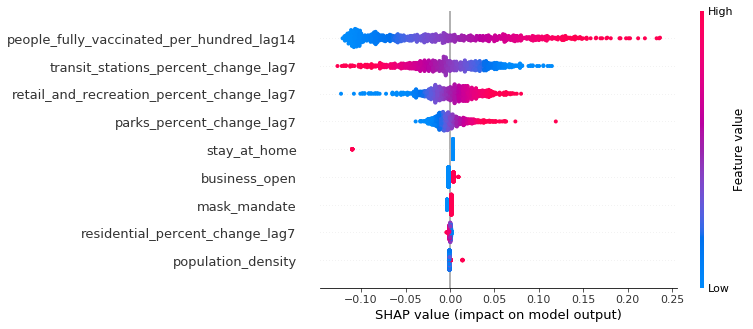

In [140]:
shap.summary_plot(shap_values, X_test)

### Desicion Tree

In [141]:
cols = c.copy()
X = data_without_na[cols]
X_train, X_test, y_train, y_test = train_test_split(X, Y2, test_size=0.2, random_state=42)

In [142]:
clf = tree.DecisionTreeRegressor(random_state=42)

In [143]:
grid = {'criterion': ["mse", "friedman_mse", "mae", "poisson"],
               'max_features': ['auto', 'sqrt'],
               'max_depth': range(2, 13),
               'min_samples_leaf': [1, 2, 4],}

In [144]:
clf_random = GridSearchCV(estimator = clf, param_grid = grid, cv = 3, n_jobs = -2)

In [145]:
clf_random.fit(X_train, y_train)

One or more of the test scores are non-finite: [ 0.2421187   0.2421187   0.2421187   0.06295423  0.06295423  0.06295423
  0.24249515  0.24249515  0.24627264  0.10419419  0.10484587  0.10161655
  0.2374377   0.25716527  0.26255782  0.14157351  0.14124524  0.14498062
  0.22650782  0.24405243  0.24538683  0.17467315  0.18540708  0.19873849
  0.21528963  0.21076217  0.23133291  0.18485526  0.18637331  0.17493709
  0.16999121  0.19942255  0.2141865   0.16141267  0.16485611  0.20981508
  0.15345458  0.1702055   0.19726909  0.07627585  0.13511647  0.16891046
  0.12204409  0.12992628  0.1848084   0.08036044  0.09874465  0.15155622
  0.08664069  0.11980896  0.16869475  0.0163559   0.08125775  0.14403914
  0.07049733  0.09877278  0.14872207 -0.22819179  0.00806484  0.10794435
 -0.00685984  0.04631701  0.14446028 -0.17837074  0.03422869  0.06067118
  0.2421187   0.2421187   0.2421187   0.06295423  0.06295423  0.06295423
  0.24249515  0.24249515  0.24627264  0.10419419  0.10484587  0.10161655
  0.

GridSearchCV(cv=3, estimator=DecisionTreeRegressor(random_state=42), n_jobs=-2,
             param_grid={'criterion': ['mse', 'friedman_mse', 'mae', 'poisson'],
                         'max_depth': range(2, 13),
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [1, 2, 4]})

In [146]:
clf_random.best_estimator_

DecisionTreeRegressor(max_depth=4, max_features='auto', min_samples_leaf=4,
                      random_state=42)

In [147]:
best_model = clf_random.best_estimator_

In [148]:
best_model.fit(X_train, y_train)
y_pred = best_model.predict(X_test)
r2_score(y_test, y_pred)

0.23397375978978574

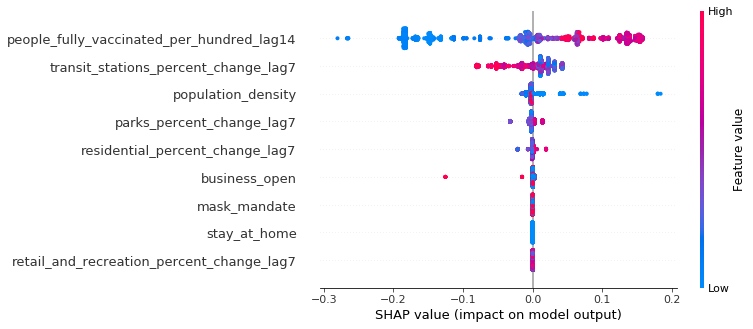

In [149]:
explainer = shap.TreeExplainer(best_model)
shap_values = explainer(X_train)
shap.plots.beeswarm(shap_values)

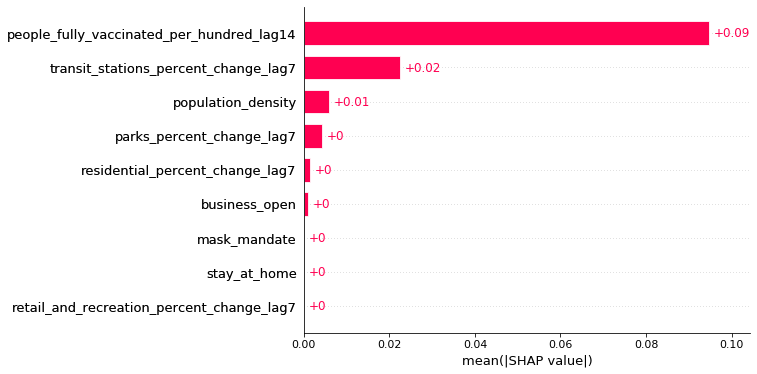

In [150]:
shap.plots.bar(shap_values)

### Random forest

In [151]:
X = data_without_na[c]
X_train, X_test, y_train, y_test = train_test_split(X, Y2, test_size=0.2, random_state=42)
rf = RandomForestRegressor()

In [152]:
grid = {'n_estimators': range(200, 2001, 200),
               'max_features': ['auto', 'sqrt'],
               'max_depth': range(2, 15, 2),
               'min_samples_leaf': [1, 2, 4],
            'bootstrap': [True, False]}

In [153]:
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -2)

In [154]:
rf_random.fit(X_train, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits
A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


RandomizedSearchCV(cv=3, estimator=RandomForestRegressor(), n_iter=100,
                   n_jobs=-2,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': range(2, 15, 2),
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'n_estimators': range(200, 2001, 200)},
                   random_state=42, verbose=2)

In [155]:
rf_random.best_params_

{'n_estimators': 1800,
 'min_samples_leaf': 1,
 'max_features': 'auto',
 'max_depth': 14,
 'bootstrap': True}

In [156]:
base_model = RandomForestRegressor(n_estimators = 10, random_state = 42)
base_model.fit(X_train, y_train)
y_pred = base_model.predict(X_test)
r2_score(y_test, y_pred)

0.3913077447351301

In [157]:
model = rf_random.best_estimator_
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
r2_score(y_test, y_pred)

0.45982055749749184

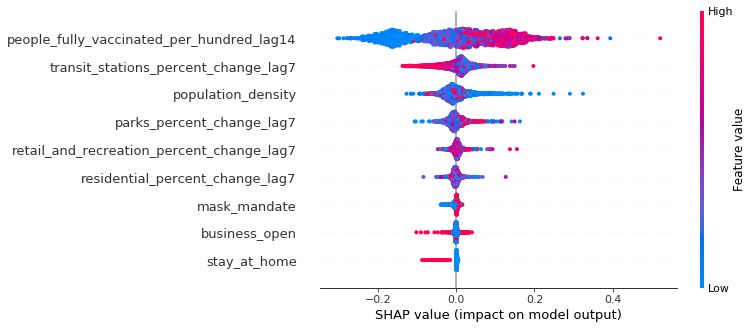

In [158]:
explainer = shap.TreeExplainer(model)
shap_values = explainer(X_train)
shap.plots.beeswarm(shap_values)

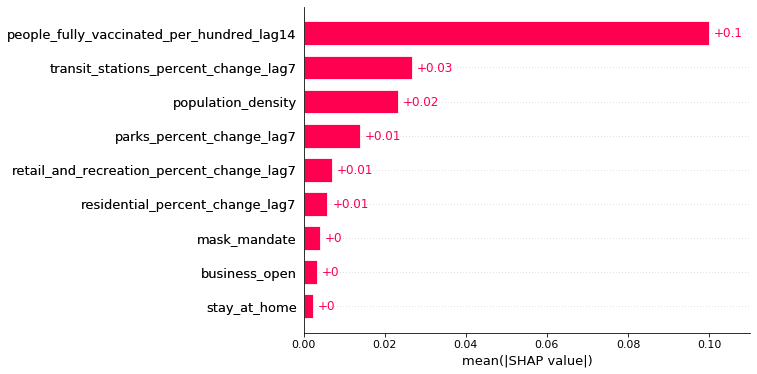

In [159]:
shap.plots.bar(shap_values)

### SVM

In [160]:
X = data_without_na[c]
X_train, X_test, y_train, y_test = train_test_split(X, Y2, test_size=0.2, random_state=42)

In [161]:
for k in ["linear", "poly", "rbf", "sigmoid"]:
    regr = make_pipeline(StandardScaler(), SVR(kernel=k, C=1.0))
    regr.fit(X_train, y_train)
    y_pred = regr.predict(X_test)
    print(k, r2_score(y_test, y_pred))

linear 0.19802429779258668
poly 0.24067495251301507
rbf 0.30271242206983107
sigmoid -58569.021389492074


In [162]:
for k in ["linear", "poly", "rbf", "sigmoid"]:
    regr = make_pipeline(RobustScaler(), SVR(kernel=k, C=1.0, epsilon=0.0001))
    regr.fit(X_train, y_train)
    y_pred = regr.predict(X_test)
    print(k, r2_score(y_test, y_pred))

linear 0.18936184411464707
poly 0.024069565702569684
rbf 0.22797989279505892
sigmoid -190927.79469063345


In [163]:
model = SVR(kernel="poly", C=1.0, epsilon=0.0001)
scaler = RobustScaler()
X = data_without_na[c]
X_scaled = scaler.fit_transform(X)
X_scaled_df = pd.DataFrame(X_scaled, columns = X.columns)
X_train, X_test, y_train, y_test = train_test_split(X_scaled_df, Y2, test_size=0.2, random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
print(r2_score(y_test, y_pred))

0.02566897504581611


In [164]:
explainer = shap.KernelExplainer(model.predict, X_train[:50])
shap_values = explainer.shap_values(X_test[:50], nsamples=100)

100%|██████████| 50/50 [00:22<00:00,  2.24it/s]


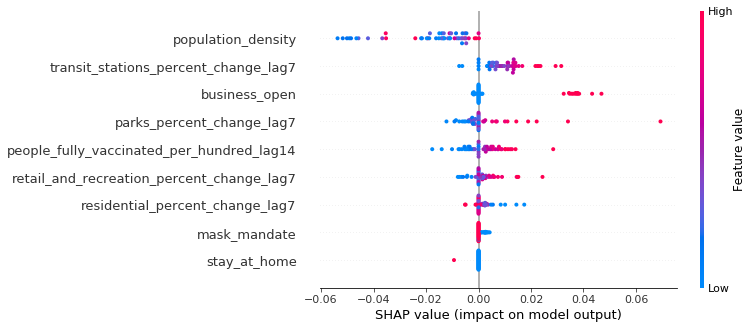

In [165]:
shap.summary_plot(shap_values, X_test[:50])

### KNN

In [166]:
from sklearn.neighbors import KNeighborsRegressor

In [167]:
X = data_without_na[c]
X_scaled = scaler.fit_transform(X)
X_scaled_df = pd.DataFrame(X_scaled, columns = X.columns)
X_train, X_test, y_train, y_test = train_test_split(X_scaled_df, Y2, test_size=0.2, random_state=42)

In [168]:
neigh = KNeighborsRegressor()

In [169]:
grid = {"n_neighbors": range(2, 30), "weights": ["uniform", "distance"]}
neigh_random = GridSearchCV(estimator = neigh, param_grid = grid, cv = 3, n_jobs = -2)

In [170]:
neigh_random.fit(X_train, y_train)

GridSearchCV(cv=3, estimator=KNeighborsRegressor(), n_jobs=-2,
             param_grid={'n_neighbors': range(2, 30),
                         'weights': ['uniform', 'distance']})

In [171]:
neigh_random.best_estimator_

KNeighborsRegressor(n_neighbors=21, weights='distance')

In [172]:
best_model = neigh_random.best_estimator_
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
r2_score(y_test, y_pred)

0.02566897504581611

In [173]:
explainer = shap.KernelExplainer(best_model.predict, X_train[:100])
shap_values = explainer.shap_values(X_test[:100])

100%|██████████| 100/100 [02:19<00:00,  1.40s/it]


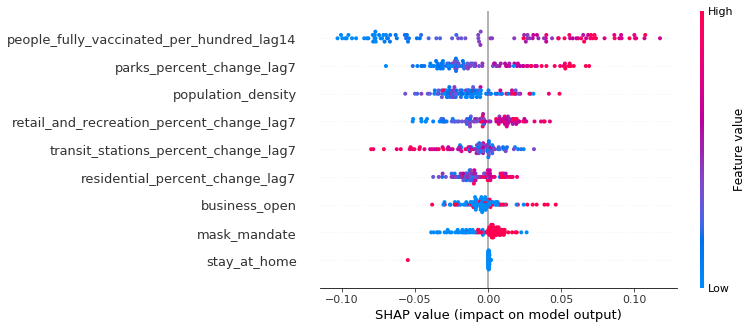

In [174]:
shap.summary_plot(shap_values, X_test[:100])

## Transform Y to categorical data

In [175]:
Y3 = Y2.copy()

In [176]:
Y3[Y3<0] = 0
Y3[Y3>0] = 1
Y3[Y3==0] = "decrease"
Y3[Y3==1] = "increase"

### Logistic regression

In [177]:
from sklearn.linear_model import LogisticRegression

In [178]:
X = data_without_na[c]
X_scaled = scaler.fit_transform(X)
X_scaled_df = pd.DataFrame(X_scaled, columns = X.columns)
X_train, X_test, y_train, y_test = train_test_split(X_scaled_df, Y3, test_size=0.2, random_state=42)

In [179]:
clf = LogisticRegression(random_state=42).fit(X_train, y_train)

In [180]:
clf.score(X_test, y_test)

0.729518855656697

In [181]:
explainer = shap.LinearExplainer(clf, X_train)
shap_values = explainer.shap_values(X_test)

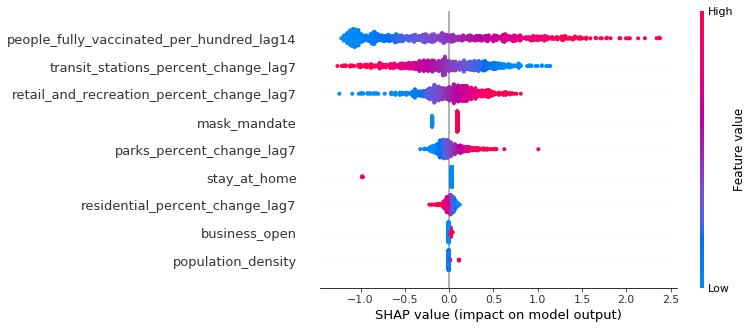

In [182]:
shap.summary_plot(shap_values, X_test)

### Decision Trees

In [183]:
from sklearn.tree import DecisionTreeClassifier

In [215]:
X = data_without_na[c]
X_train, X_test, y_train, y_test = train_test_split(X, Y3, test_size=0.2, random_state=42)

In [185]:
clf = DecisionTreeClassifier(random_state=42)

In [186]:
grid = {'max_features': ['auto', 'sqrt'],
               'max_depth': range(2, 13),
               'min_samples_leaf': [1, 2, 4],}

In [187]:
clf_random = GridSearchCV(estimator = clf, param_grid = grid, cv = 3, n_jobs = -2)
clf_random.fit(X_train, y_train)

GridSearchCV(cv=3, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-2,
             param_grid={'max_depth': range(2, 13),
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [1, 2, 4]})

In [188]:
clf_random.best_estimator_

DecisionTreeClassifier(max_depth=9, max_features='auto', min_samples_leaf=4,
                       random_state=42)

In [189]:
best_model = clf_random.best_estimator_
best_model.fit(X_train, y_train)
best_model.score(X_test, y_test)

0.7516254876462939

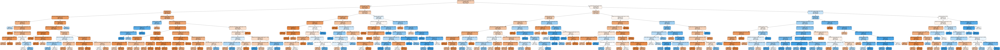

In [190]:
from IPython.display import Image  
import pydotplus
thestring = tree.export_graphviz(best_model, out_file=None,  
                         feature_names=X_train.columns.values, 
                         class_names=['increase', 'decrease'],  
                         filled=True, rounded=True,  
                         special_characters=True,impurity=False)
graph = pydotplus.graph_from_dot_data(thestring)  
Image(graph.create_png())  

In [191]:
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(X)

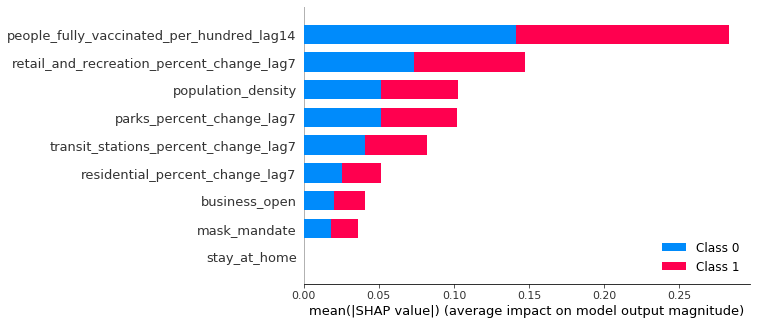

In [192]:
shap.summary_plot(shap_values, X)

In [241]:
best_model = DecisionTreeClassifier(max_depth=9, max_features='auto', min_samples_leaf=4,
                       random_state=42)
best_model.fit(X_train, y_train)
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(X)

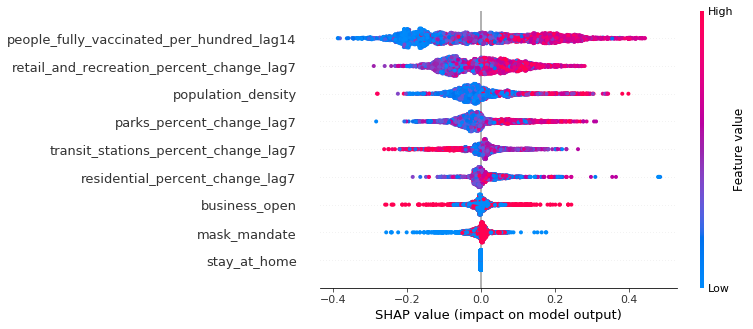

In [242]:
shap.summary_plot(shap_values[1], X)

### Random forest

In [193]:
from sklearn.ensemble import RandomForestClassifier

In [194]:
X = data_without_na[c]
X_train, X_test, y_train, y_test = train_test_split(X, Y3, test_size=0.2, random_state=42)
clf = RandomForestClassifier()

In [195]:
grid = {'n_estimators': range(200, 2001, 200),
               'max_features': ['auto', 'sqrt'],
               'max_depth': range(2, 15, 2),
               'min_samples_leaf': [1, 2, 4],
            'bootstrap': [True, False]}

In [196]:
clf_random = RandomizedSearchCV(estimator = clf, param_distributions = grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -2)
clf_random.fit(X_train, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits
A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-2,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': range(2, 15, 2),
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'n_estimators': range(200, 2001, 200)},
                   random_state=42, verbose=2)

In [244]:
clf_random.best_estimator_

RandomForestClassifier(max_depth=14, n_estimators=400)

In [198]:
best_model = clf_random.best_estimator_
best_model.fit(X_train, y_train)
best_model.score(X_test, y_test)

0.7958387516254877

In [199]:
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(X)

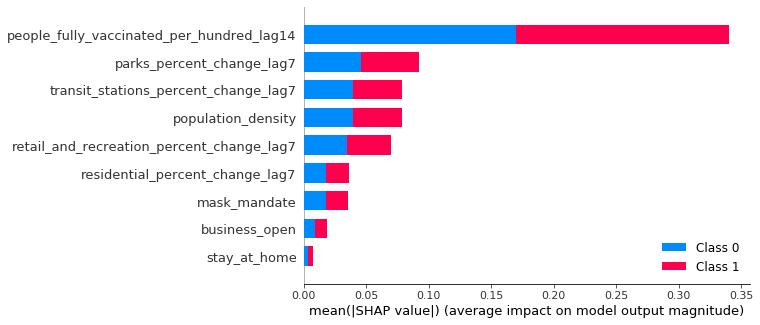

In [200]:
shap.summary_plot(shap_values, X)

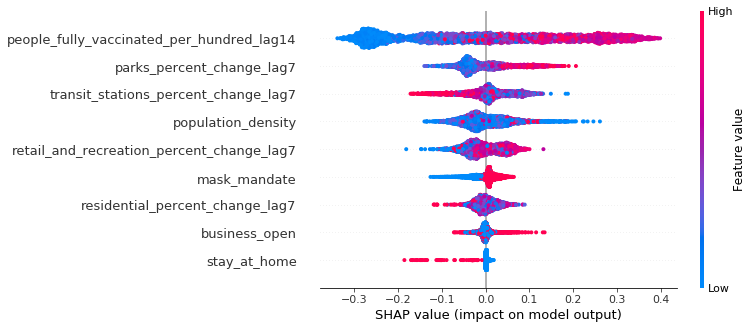

In [245]:
best_model = RandomForestClassifier(max_depth=14, n_estimators=400)
best_model.fit(X_train, y_train)
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(X)
shap.summary_plot(shap_values[1], X)

### SVM

In [201]:
from sklearn.svm import SVC

In [202]:
for k in ["linear", "poly", "rbf", "sigmoid"]:
    clf = make_pipeline(RobustScaler(), SVC(kernel=k, C=1.0, probability=True))
    clf.fit(X_train, y_train)
    print(k, clf.score(X_test, y_test))

linear 0.7438231469440832
poly 0.6345903771131339
rbf 0.7217165149544863
sigmoid 0.5539661898569571


In [246]:
model = SVC(kernel="rbf", C=1.0, probability=True)
scaler = RobustScaler()
X = data_without_na[c]
X_scaled = scaler.fit_transform(X)
X_scaled_df = pd.DataFrame(X_scaled, columns = X.columns)
X_train, X_test, y_train, y_test = train_test_split(X_scaled_df, Y3, test_size=0.2, random_state=42)
model.fit(X_train, y_train)
model.score(X_test, y_test)

0.7217165149544863

In [204]:
explainer = shap.KernelExplainer(model.predict_proba, X_train[:50])
shap_values = explainer.shap_values(X_test[:50], nsamples=100)

100%|██████████| 50/50 [00:52<00:00,  1.06s/it]


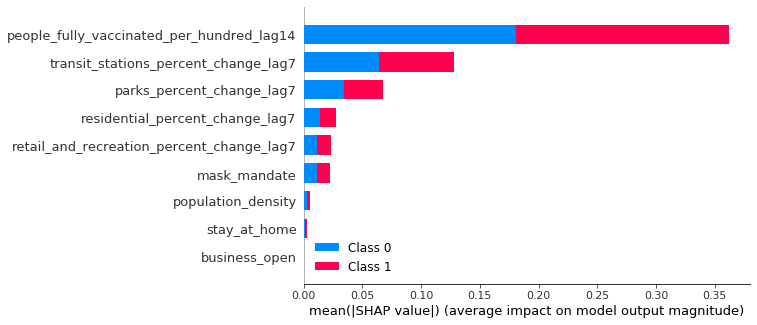

In [205]:
shap.summary_plot(shap_values, X_test[:50])

In [ ]:
explainer = shap.KernelExplainer(model.predict_proba, X_train[:200])
shap_values = explainer.shap_values(X_test[:200], nsamples=100)

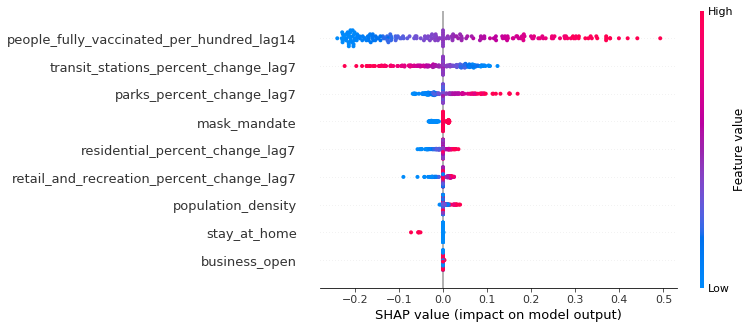

In [250]:
shap.summary_plot(shap_values[1], X_test[:200])

### KNN

In [206]:
from sklearn.neighbors import KNeighborsClassifier

In [252]:
X = data_without_na[c]
X_scaled = scaler.fit_transform(X)
X_scaled_df = pd.DataFrame(X_scaled, columns = X.columns)
X_train, X_test, y_train, y_test = train_test_split(X_scaled_df, Y3, test_size=0.2, random_state=42)

In [208]:
neigh = KNeighborsClassifier()

In [209]:
grid = {"n_neighbors": range(2, 30), "weights": ["uniform", "distance"]}
neigh_random = GridSearchCV(estimator = neigh, param_grid = grid, cv = 3, n_jobs = -2)
neigh_random.fit(X_train, y_train)

GridSearchCV(cv=3, estimator=KNeighborsClassifier(), n_jobs=-2,
             param_grid={'n_neighbors': range(2, 30),
                         'weights': ['uniform', 'distance']})

In [210]:
neigh_random.best_estimator_

KNeighborsClassifier(n_neighbors=28, weights='distance')

In [254]:
best_model = KNeighborsClassifier(n_neighbors=28, weights='distance')
best_model.fit(X_train, y_train)
best_model.score(X_test, y_test)

0.7568270481144344

In [212]:
explainer = shap.KernelExplainer(best_model.predict_proba, X_train[:100])
shap_values = explainer.shap_values(X_test[:100])

100%|██████████| 100/100 [02:46<00:00,  1.67s/it]


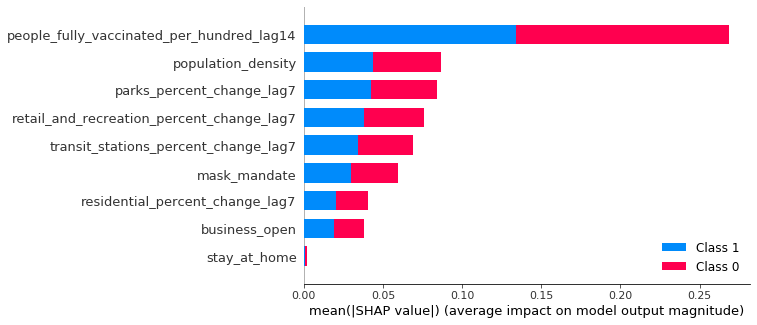

In [213]:
shap.summary_plot(shap_values, X_test[:100])

In [255]:
explainer = shap.KernelExplainer(best_model.predict_proba, X_train[:200])
shap_values = explainer.shap_values(X_test[:200], nsamples=100)

Using 200 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|██████████| 200/200 [02:12<00:00,  1.51it/s]


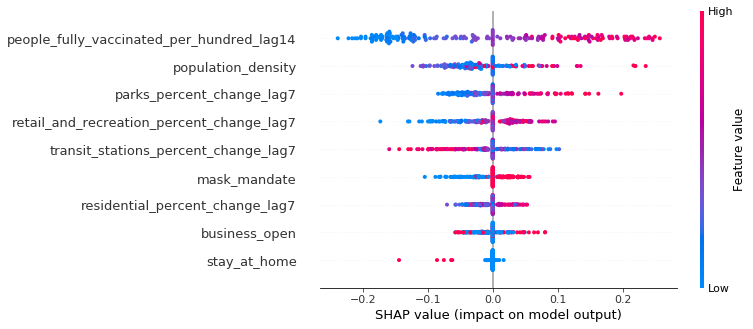

In [256]:
shap.summary_plot(shap_values[1], X_test[:200])

## Deep learning model